In [1]:
import numpy as np
import napari
import pickle
from skimage import data
from scipy import stats
from scipy import signal
from tifffile import tifffile
from os.path import sep
from matplotlib import pyplot as plt
import math
import matplotlib.colors as colors
import xarray as xr
import pandas as pd
import seaborn as sns
import json
import os
from scipy.ndimage import gaussian_filter1d

In [2]:
import SessionTools.two_photon as st2p
from fly2p_function_TQ.imaging_2p_preprocessing import combine_single_tiff,combine_single_tiff_V3, computeMotionShift, motionCorrection, low_pass_filter_TQ, high_pass_filter_TQ, averaging_frame,combine_single_tiff_ch1
from fly2p_function_TQ.imaging_2p_preprocessing import combine_PB_corresponding_ROI,get_raw_F,get_dff_array, normalizing_dff_array, combine_single_tiff_V2, combine_EB_corresponding_ROI
from fly2p_function_TQ.imaging_2p_PVA_functions import PVA_radian_calcul, PVAangleToRoi, PVA_radian_to_angle, PVA_angle_to_radian, calcualteBumpAmplitude,pol2cart,calcualteBumpAmplitude_V3,calculateBumpWidth_v1
from fly2p_function_TQ.imaging_2p_fictrac_imaging_alignment import downsample_heading_to_total_volume, offset_calculation,fictrack_signal_decoding,moving_wrapped_plot_by_offset
from fly2p_function_TQ.imaging_2p_delta7_write_in_ex_vivo import analyze_peak_shifted_activity,process_group,plot_group_comparison

In [3]:
# Some key parameters for imaging analysis (for futuure should come from direct reading of metadata file)
volume_cycle = 2843
volume_time = 0.12312
volume_rate = 1/volume_time
slice_per_volume = 9
fictrack_sampling_rate = 50000

# 1 for cl, 0 for dark trial
trial_type = 0

# 1 for PB, 0 for EB, 2 for FB 
brain_region = 1

#1 for yes, 0 for no
bar_jumping = 0

In [4]:
time_array_imaging = np.arange(volume_cycle)/volume_rate

In [5]:
image_data_combined, tiff_file_sequence = combine_single_tiff(slice_num = slice_per_volume, cycle_num = volume_cycle, file_dir = '/home/tianhaoqiu/Desktop/TQfly601-002')

In [6]:
image = image_data_combined
imgStack = xr.DataArray(image,dims = ['volumes [s]', 'planes [µm]', 'xpix [µm]', 'ypix [µm]'])

In [7]:
imgStack_napari = np.expand_dims(imgStack, axis =0)

In [8]:
imgStack_napari.shape

(1, 2843, 9, 186, 405)

In [9]:
viewer = napari.Viewer()
new_layer = viewer.add_image(imgStack_napari.mean(axis=1))

In [10]:
label = tifffile.imread("/home/tianhaoqiu/Documents/GitHub/2p_analysis/napari_roi/Test and screening/ROI_16_TQfly601-001.tif")
napari_roi = np.squeeze(label , axis=0) 

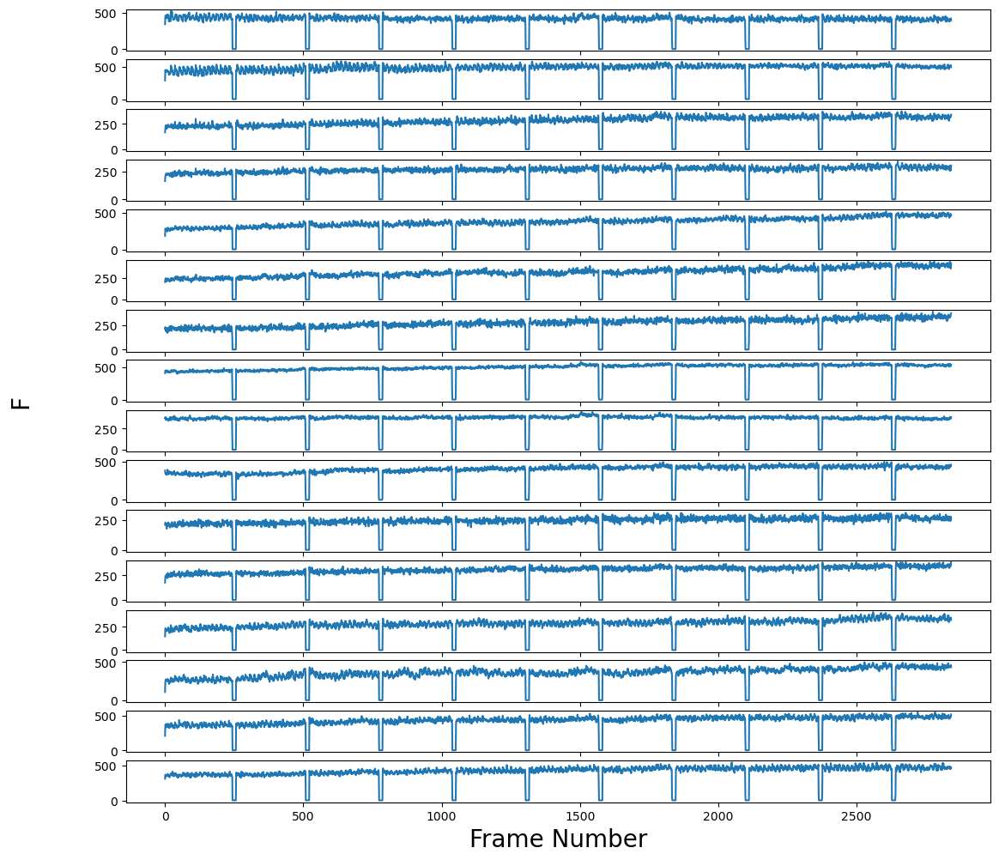

In [11]:
ROI_total = 16
F_array = get_raw_F(ROI_total, napari_roi, imgStack)

In [12]:
# Define parameters
thresholds = np.percentile(F_array, 5, axis=0)  # Compute separate threshold per ROI (5th percentile)
min_duration = 8  # Minimum number of frames for a valid stimulation period
start_frame = 100  # Ignore the first 100 frames before detecting stimulation

# Step 1: Detect low-signal frames per ROI
low_signal_per_roi = F_array < thresholds  # Boolean mask: True where signal is below threshold

# Step 2: Identify frames where **any** ROI detects a stimulation period
low_signal_any = np.any(low_signal_per_roi, axis=1)  # If any ROI marks this frame, it's a stim frame

# Step 3: Find contiguous low-signal periods **starting from frame 100**
stimulation_periods = []
current_start = None

for i in range(start_frame, len(low_signal_any)):  # Start from frame 100
    if low_signal_any[i]:  # If any ROI classifies this frame as stim
        if current_start is None:
            current_start = i  # Mark the start of a stimulation period
    else:
        if current_start is not None:
            # Check if the stim period is long enough
            if i - current_start >= min_duration:
                stimulation_periods.append((current_start, i - 1))
            current_start = None  # Reset

# Handle the last stimulation period if it extends until the end
if current_start is not None and len(low_signal_any) - current_start >= min_duration:
    stimulation_periods.append((current_start, len(low_signal_any) - 1))

# Print results
print("Detected Stimulation Periods (starting from frame 100):", stimulation_periods)


Detected Stimulation Periods (starting from frame 100): [(243, 256), (508, 521), (773, 786), (1038, 1051), (1303, 1316), (1568, 1581), (1833, 1846), (2098, 2111), (2363, 2376), (2628, 2641)]


In [13]:
# Step 1: Create a mask for removal
frames_to_keep = np.ones(F_array.shape[0], dtype=bool)  # Keep all frames initially

for start, end in stimulation_periods:
    frames_to_keep[start:end+1] = False  # Mark stimulation frames as False (to be removed)


# Step 2: Apply mask to remove stimulation frames
F_array_stimulation_period_removed = F_array[frames_to_keep]

# Step 3: Find correct post-stimulation indices in `filtered_data`
stimulation_durations = np.zeros(len(stimulation_periods))
for i in range(len(stimulation_periods)):
    stimulation_durations[i] = stimulation_periods[i][1] - stimulation_periods[i][0] + 1

cut_indices = np.zeros(len(stimulation_periods))
for j in range(len(stimulation_periods)):
    cut_indices[j] = (stimulation_periods[j][1] + 1) - (np.sum(stimulation_durations[0:(j+1)]))
cut_indices = cut_indices.astype(int)

# Step 4: Print results
print("Original shape:", F_array.shape)
print("F_array_stimulation_period_removed :", F_array_stimulation_period_removed .shape)
print("Cut indices (in F_array_stimulation_period_removed ):", cut_indices)

Original shape: (2843, 16)
F_array_stimulation_period_removed : (2703, 16)
Cut indices (in F_array_stimulation_period_removed ): [ 243  494  745  996 1247 1498 1749 2000 2251 2502]


In [14]:
volume_cycle_new = len(F_array_stimulation_period_removed )
time_array_imaging = np.arange(volume_cycle_new)/volume_rate

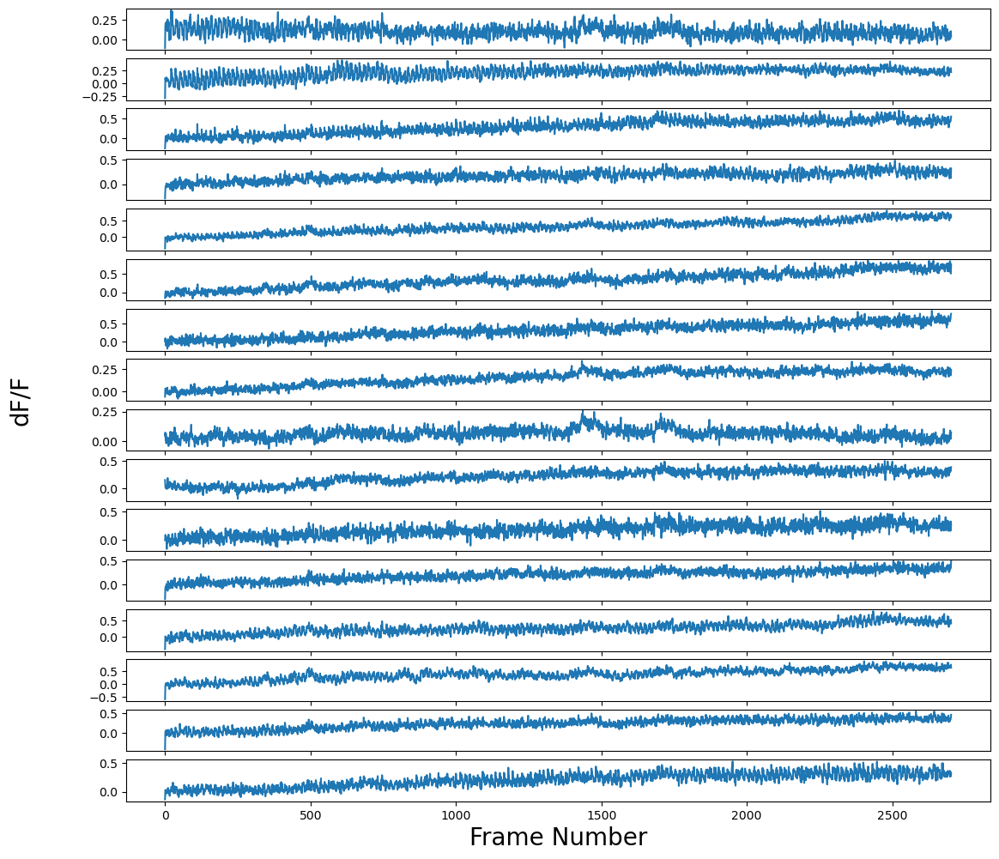

In [15]:
dF_F_array = get_dff_array(raw_F_array = F_array_stimulation_period_removed , ROI_num = ROI_total, F_zero_cutoff = 0.05, if_plot = 1)

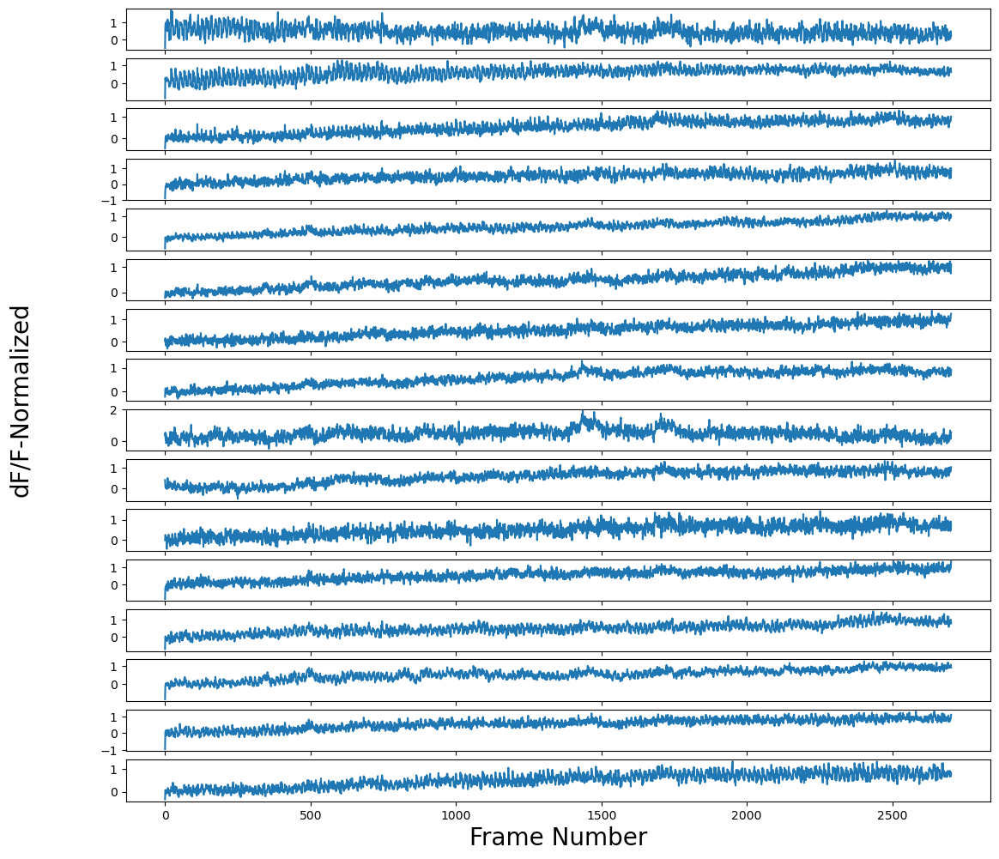

In [16]:
dF_F_array_normalized = normalizing_dff_array(dF_F_array,ROI_num= ROI_total, normalize_cutoff= 0.95, if_plot = 1)

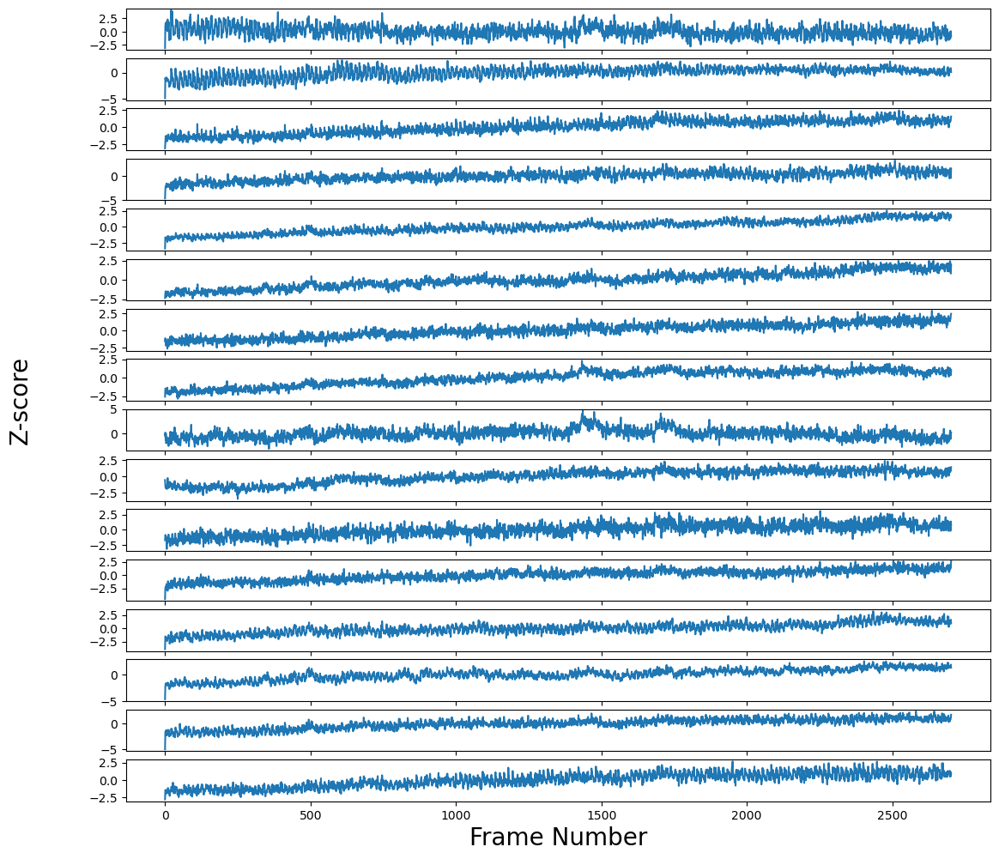

In [17]:
# Z-score: alternative way to calculate df/f
Z_score_array = np.zeros((len(F_array_stimulation_period_removed), ROI_total))
F_sd = np.std(F_array_stimulation_period_removed , axis = 0)
F_mean = np.mean(F_array_stimulation_period_removed , axis = 0)
for z_index in range(ROI_total):
    Z_score_array [:,z_index] = (F_array_stimulation_period_removed [:,z_index] - F_mean[z_index])/F_sd[z_index]

fig, axs = plt.subplots(ROI_total, 1, figsize=(13, 12))
for i in range(ROI_total):
    ax = axs[i]
    ax.plot(Z_score_array [:,i])
fig.supylabel('Z-score',fontsize=20)
plt.xlabel('Frame Number', fontsize=20)
plt.show()

In [18]:
#Median_filtering the normalized df_f trace
for i in range (ROI_total):
    dF_F_array_normalized[:,i] = signal.medfilt(dF_F_array_normalized[:,i],kernel_size =3)
    Z_score_array [:,i] = signal.medfilt(Z_score_array [:,i],kernel_size =3)

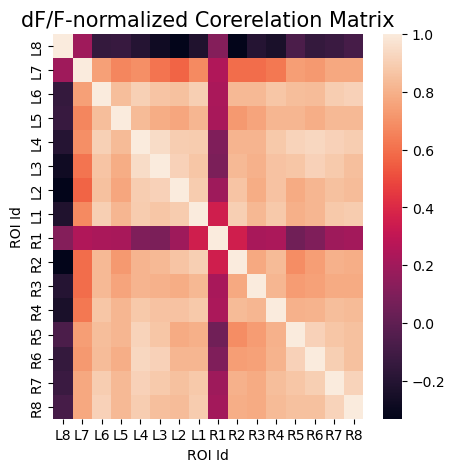

In [19]:
#Create a correlation matrix to look at the correlation between corresponding golemuruli in left/right PB
if ROI_total == 16:
    df_f_dataframe_normalized = pd.DataFrame(dF_F_array_normalized, columns=['L8', 'L7', 'L6','L5','L4','L3','L2','L1','R1','R2','R3','R4','R5','R6','R7','R8'])
    correlation_matrix_df_f = df_f_dataframe_normalized.corr()
    plt.figure(figsize= (5,5))
    sns.heatmap(correlation_matrix_df_f)
    plt.xlabel('ROI Id', fontsize=10)
    plt.ylabel('ROI Id', fontsize=10)
    plt.title('dF/F-normalized Corerelation Matrix', fontsize=15)

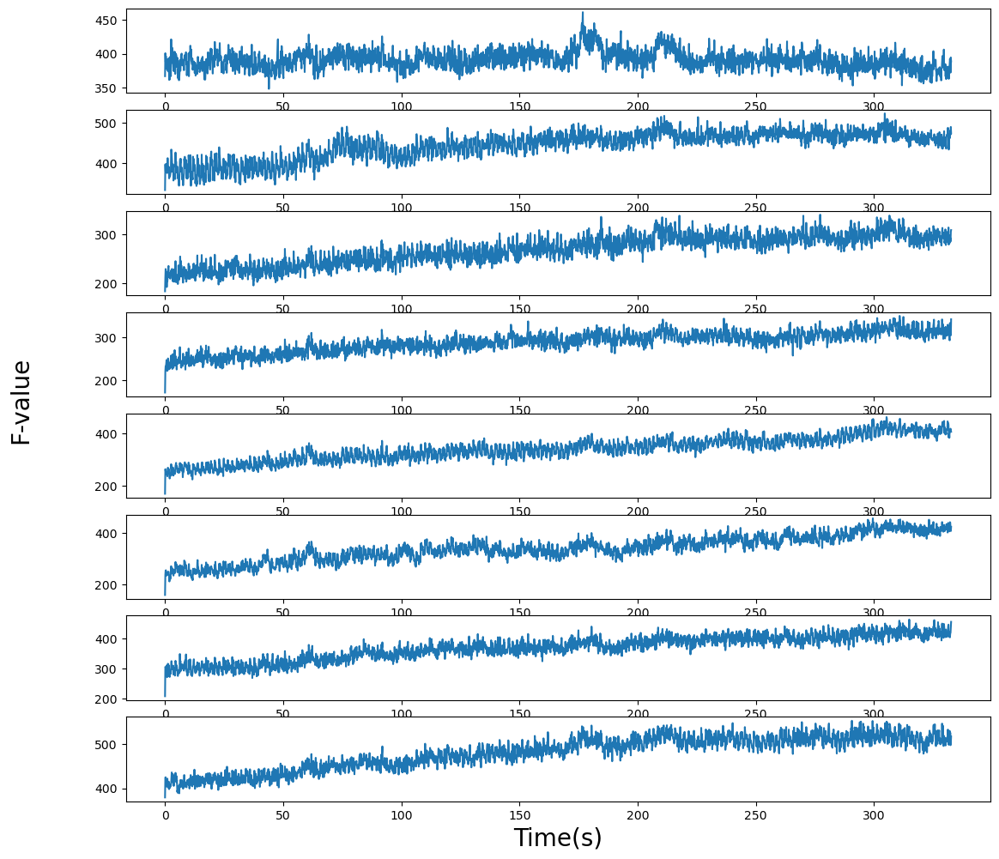

In [20]:
F_8_roi = combine_PB_corresponding_ROI(dff_array_input = F_array_stimulation_period_removed , napari_ROI = napari_roi , ROI_num = 8, mode =2, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging,F_8_roi[:,i])
fig.supylabel('F-value',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

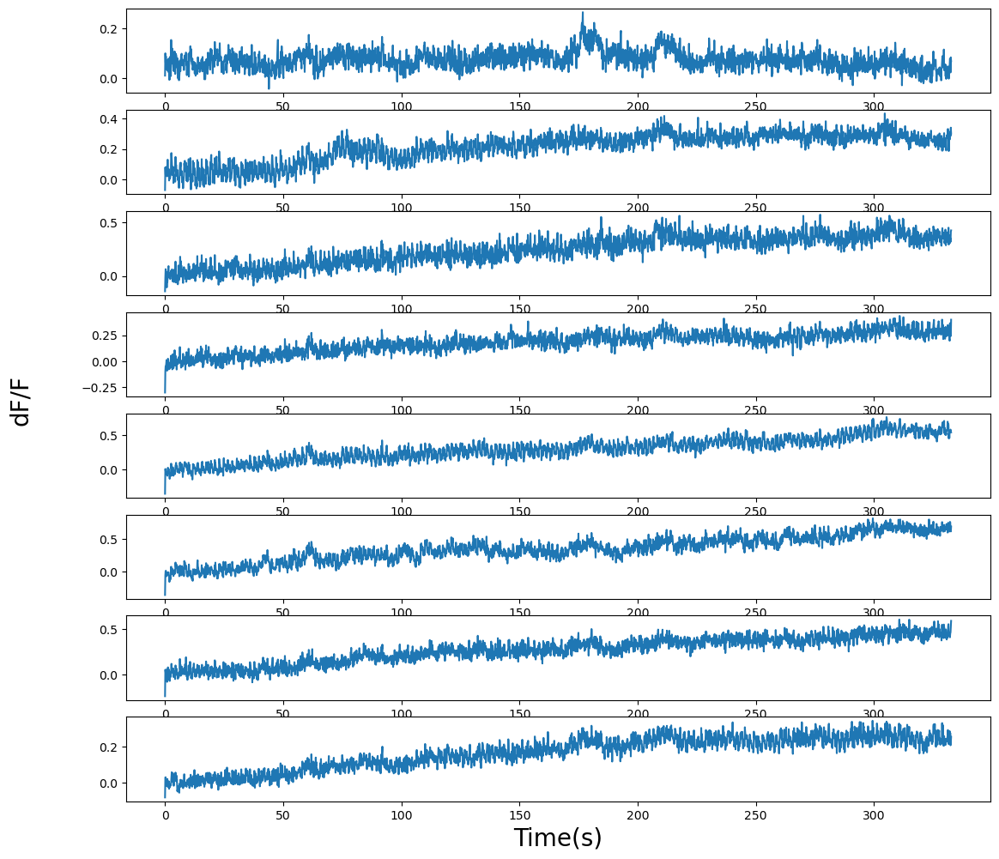

In [21]:
dF_F_array_8_roi = combine_PB_corresponding_ROI(dff_array_input = dF_F_array, napari_ROI = napari_roi , ROI_num = 8, mode = 2, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, dF_F_array_8_roi[:,i])
fig.supylabel('dF/F',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

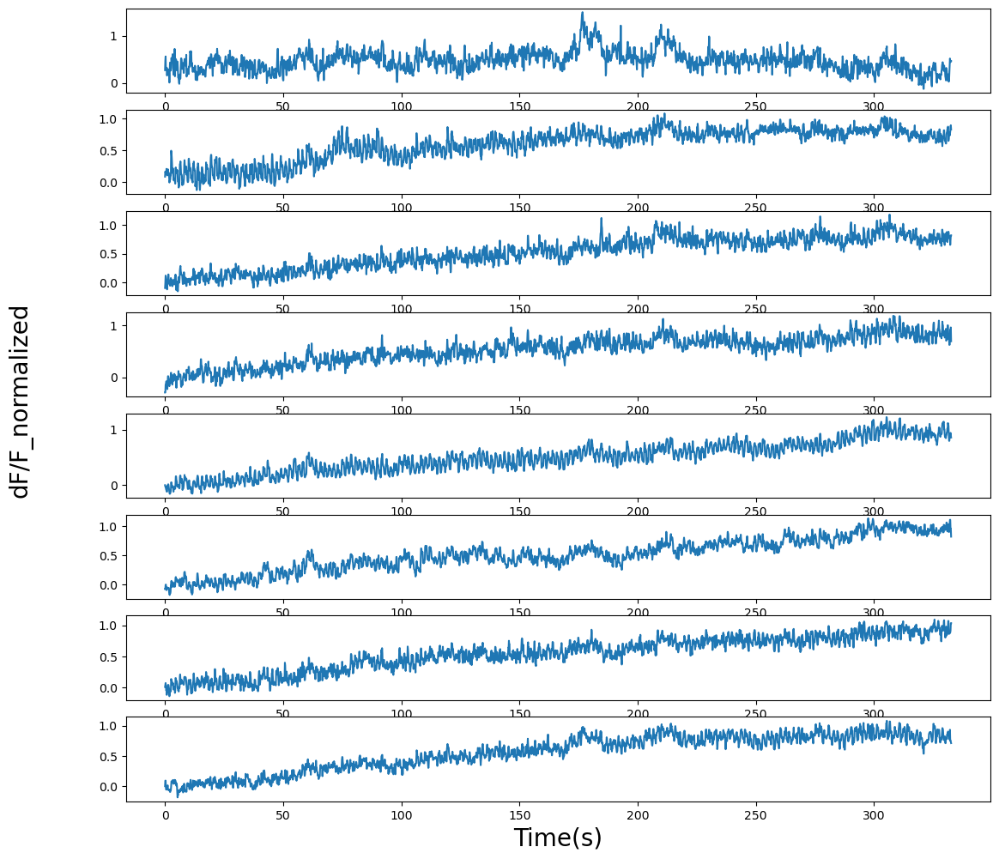

In [22]:
dF_F_array_8_roi_normalized = combine_PB_corresponding_ROI(dff_array_input = dF_F_array_normalized, napari_ROI = napari_roi , ROI_num = 8, mode = 2, time_array_imaging = time_array_imaging)
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, dF_F_array_8_roi_normalized[:,i])
fig.supylabel('dF/F_normalized',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

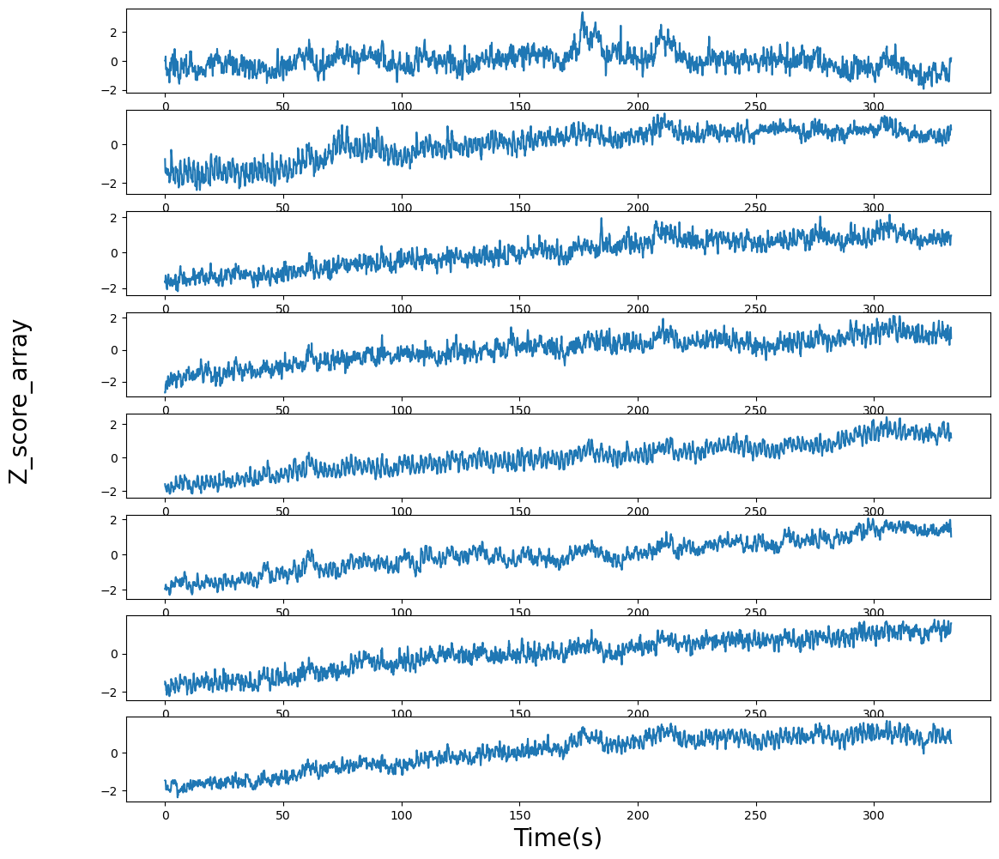

In [23]:
Z_score_array_8_roi = combine_PB_corresponding_ROI(dff_array_input = Z_score_array, napari_ROI = napari_roi , ROI_num = 8, mode = 2, time_array_imaging = time_array_imaging)   
ROI_number_combined = 8
fig, axs = plt.subplots(ROI_number_combined, 1, figsize=(13, 12))
for i in range(ROI_number_combined):
    ax = axs[i]
    ax.plot(time_array_imaging, Z_score_array_8_roi[:,i])
fig.supylabel('Z_score_array',fontsize=20)
plt.xlabel('Time(s)', fontsize=20)
plt.show()

In [24]:
PVA_radian_array, PVA_strength = PVA_radian_calcul(dF_F_array_8_roi, volume_cycle_new,ROI_number_combined )
PVA_radian_array_normalized, PVA_strength_normalized = PVA_radian_calcul(dF_F_array_8_roi_normalized, volume_cycle_new,ROI_number_combined)
PVA_radian_array_z, PVA_strength_z_scored = PVA_radian_calcul(Z_score_array_8_roi, volume_cycle_new,ROI_number_combined)

In [25]:
PVA_angle_Array = PVA_radian_to_angle(PVA_radian_array)
PVA_angle_Array_normalized = PVA_radian_to_angle(PVA_radian_array_normalized)
PVA_angle_array_z = PVA_radian_to_angle(PVA_radian_array_z)

In [26]:
if ROI_total == 16:
    PVA_radian_array_normalized_16, PVA_strength_normalized_16 = PVA_radian_calcul(dF_F_array_normalized, volume_cycle_new, 16)
    PVA_angle_Array_normalized_16  = PVA_radian_to_angle(PVA_radian_array_normalized_16 )

In [27]:
PVA_ROI_assigned = PVAangleToRoi(PVA_angle_Array)
PVA_ROI_assigned_normalized = PVAangleToRoi(PVA_angle_Array_normalized)
PVA_ROI_assigned_z = PVAangleToRoi(PVA_angle_array_z)

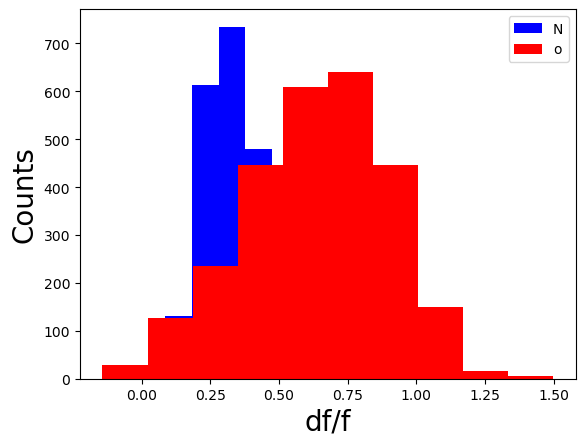

In [28]:
bump_amplitude_dff = calcualteBumpAmplitude(dF_F_array_8_roi)
bump_amplitude_dff_normalized = calcualteBumpAmplitude(dF_F_array_8_roi_normalized)
bump_amplitude_dff_normalized_v3 = calcualteBumpAmplitude_V3(dF_F_array_8_roi_normalized,PVA_radian_array_normalized)[0]
plt.hist(bump_amplitude_dff_normalized, color ='b')
plt.hist(bump_amplitude_dff_normalized_v3, color ='r')
plt.legend('Normalized')

plt.ylabel('Counts',fontsize=20)
plt.xlabel('df/f', fontsize=20)
plt.show()

In [29]:
stimulation_start_index = [pair[0] for pair in stimulation_periods]
stimulation_end_index = [pair[1] for pair in stimulation_periods]
pd_stimulation_periods = pd.DataFrame()
pd_stimulation_periods['stimulation_start_frame'] = stimulation_start_index
pd_stimulation_periods['stimulation_end_frame'] = stimulation_end_index
#pd_stimulation_periods.to_csv('/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/EPG_write_in/SS00096_7f_CsCHtdT/for analysis/90-stimulation-index/TQfly542-006-stimulation-frame.csv',encoding = 'utf-8', index=False)

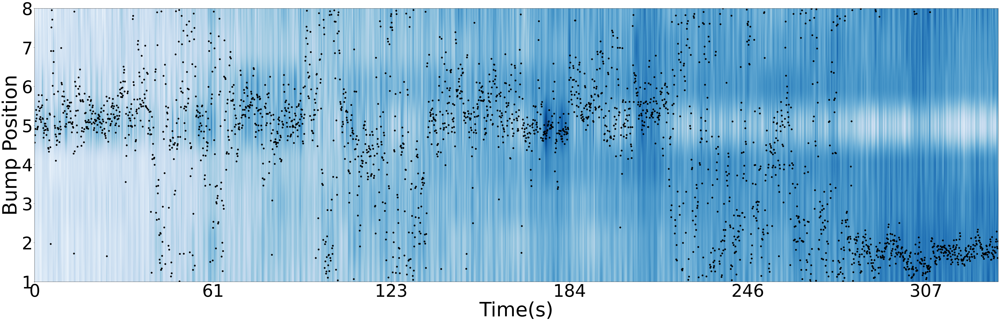

In [30]:
#Plot heatmap of signals in combined ROI and superimpose with PVA
df_dff_in_ROI_normalized = dF_F_array_8_roi_normalized.transpose()
df_dff_in_ROI_normalized_shifted = np.zeros((np.size(df_dff_in_ROI_normalized,0),np.size(df_dff_in_ROI_normalized,1)))
df_dff_in_ROI_normalized_shifted[0,:] = df_dff_in_ROI_normalized[4,:]
df_dff_in_ROI_normalized_shifted[1,:] = df_dff_in_ROI_normalized[5,:]
df_dff_in_ROI_normalized_shifted[2,:] = df_dff_in_ROI_normalized[6,:]
df_dff_in_ROI_normalized_shifted[3,:] = df_dff_in_ROI_normalized[7,:] 
df_dff_in_ROI_normalized_shifted[4,:] = df_dff_in_ROI_normalized[0,:] 
df_dff_in_ROI_normalized_shifted[5,:] = df_dff_in_ROI_normalized[1,:] 
df_dff_in_ROI_normalized_shifted[6,:] = df_dff_in_ROI_normalized[2,:] 
df_dff_in_ROI_normalized_shifted[7,:] = df_dff_in_ROI_normalized[3,:]
df_dff_in_ROI_normalized_shifted_for_plotting_part = df_dff_in_ROI_normalized_shifted
df_dff_in_ROI_normalized_shifted = pd.DataFrame(df_dff_in_ROI_normalized_shifted)
plt.figure(figsize= (70,20))
plt.imshow(df_dff_in_ROI_normalized_shifted, aspect= 'auto', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)
plt.scatter(np.arange(len(PVA_angle_Array_normalized)),7*(PVA_angle_Array_normalized+180)/2/180, color ='black', s = 40)
plt.show()

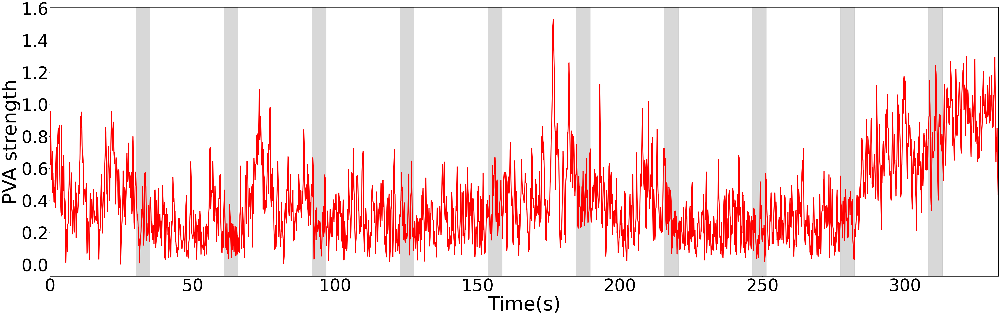

In [31]:
plt.figure(figsize= (70,20))
plt.plot(time_array_imaging,PVA_strength_normalized,color = 'r',linewidth =4)
# Step 1: Add shaded rectangles after post-stim indices (cut_indices)
for cut in cut_indices:
    start_time = (cut+1) * volume_time  
    end_time = start_time + 5  # Cover 10 seconds

    plt.axvspan(start_time, end_time, color='gray', alpha=0.3, label="Post-Stim Period" if cut == cut_indices[0] else "")

plt.xlabel('Time(s)', fontsize=80)
plt.xticks(fontsize=70)
plt.yticks(fontsize=70)
plt.xlim(0,volume_cycle_new *volume_time)
plt.ylabel('PVA strength', fontsize=80)
plt.show()

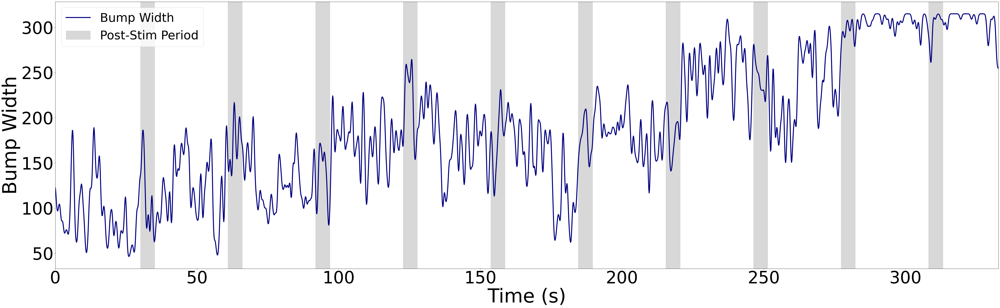

In [32]:
bump_width= calculateBumpWidth_v1(dF_F_array_8_roi_normalized,8)
bump_width_z= calculateBumpWidth_v1(Z_score_array_8_roi,8)
# Compute smoothed bump width
smoothed_bump_width = gaussian_filter1d(bump_width, sigma=3)

# Create the figure
plt.figure(figsize=(70, 20))

# Plot bump width
plt.plot(time_array_imaging, smoothed_bump_width, linewidth=4, color='navy', label="Bump Width")

# Step 1: Add shaded rectangles after post-stim indices (cut_indices)
for cut in cut_indices:
    start_time = (cut+1) * volume_time  
    end_time = start_time + 5  # Cover 10 seconds

    plt.axvspan(start_time, end_time, color='gray', alpha=0.3, label="Post-Stim Period" if cut == cut_indices[0] else "")

# Labels and axes formatting
plt.xlabel('Time (s)', fontsize=80)
plt.ylabel('Bump Width', fontsize=80)
plt.xticks(fontsize=70)
plt.yticks(fontsize=70)
plt.xlim(0, volume_cycle_new * volume_time)
plt.legend(fontsize=50)
plt.show()


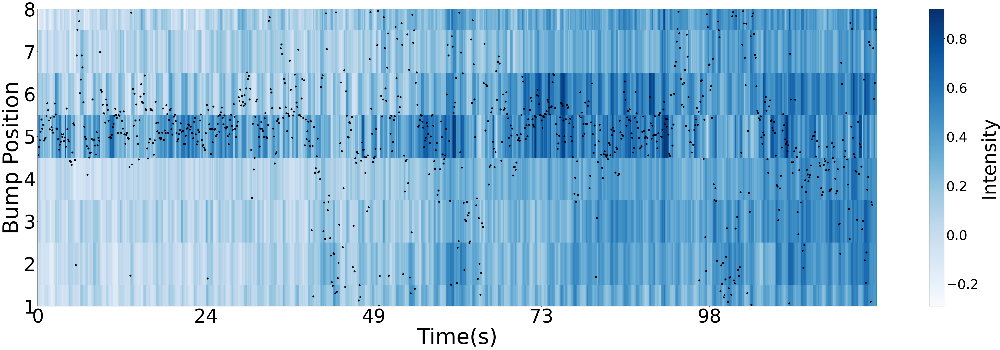

In [33]:
range_start =0
range_end = 1000
a=plt.figure(figsize= (70,20))
img = plt.imshow(df_dff_in_ROI_normalized_shifted_for_plotting_part[:,range_start:range_end], aspect= 'auto', interpolation = 'none', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate+ range_start*volume_time, dtype=np.int64), fontsize =70)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.scatter(np.arange(len(PVA_angle_Array_normalized[range_start:range_end])),7*(PVA_angle_Array_normalized[range_start:range_end]+180)/2/180, color ='black', s = 40)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)


cbar = plt.colorbar(img)
cbar.set_label('Intensity',fontsize = 70)
cbar.ax.tick_params(labelsize = 50)

plt.show()

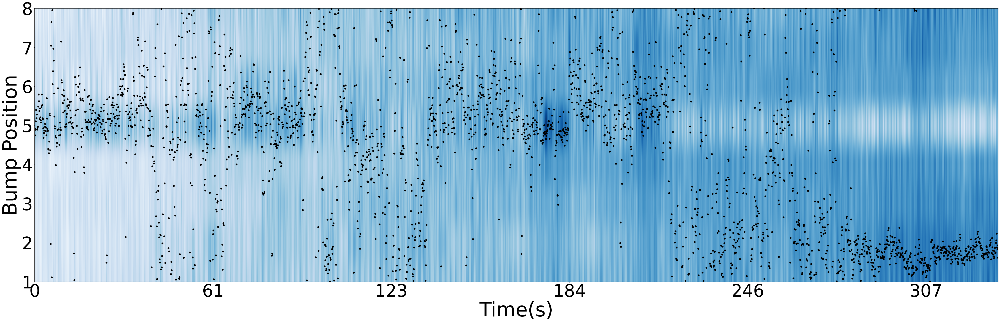

In [34]:
#Plot heatmap of signals in combined ROI and superimpose with PVA
Z_score_array_8_roi = Z_score_array_8_roi.transpose()
Z_score_array_8_roi_shifted = np.zeros((np.size(df_dff_in_ROI_normalized,0),np.size(df_dff_in_ROI_normalized,1)))
Z_score_array_8_roi_shifted[0,:] = Z_score_array_8_roi[4,:]
Z_score_array_8_roi_shifted[1,:] = Z_score_array_8_roi[5,:]
Z_score_array_8_roi_shifted[2,:] = Z_score_array_8_roi[6,:]
Z_score_array_8_roi_shifted[3,:] = Z_score_array_8_roi[7,:] 
Z_score_array_8_roi_shifted[4,:] = Z_score_array_8_roi[0,:] 
Z_score_array_8_roi_shifted[5,:] = Z_score_array_8_roi[1,:] 
Z_score_array_8_roi_shifted[6,:] = Z_score_array_8_roi[2,:] 
Z_score_array_8_roi_shifted[7,:] = Z_score_array_8_roi[3,:]
Z_score_array_8_roi_shifted = pd.DataFrame(Z_score_array_8_roi_shifted)
plt.figure(figsize= (70,20))
plt.imshow(Z_score_array_8_roi_shifted, aspect= 'auto', cmap = 'Blues')
plt.xlabel('Time(s)', fontsize=80)
plt.ylabel('Bump Position', fontsize=80)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =70)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=70)
plt.ylim(0,7)
plt.locator_params(axis ='x',nbins = 20)
plt.scatter(np.arange(len(PVA_angle_array_z)),7*(PVA_angle_array_z+180)/2/180, color ='black', s = 40)
plt.show()

In [35]:
Z_score_array_8_roi = Z_score_array_8_roi.transpose()

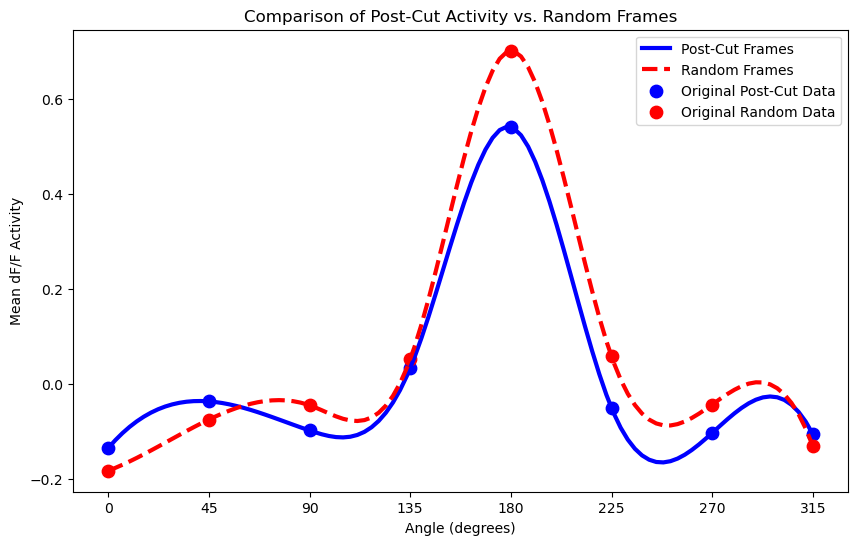

Mean FWHM of Post-Cut Distribution: 191.25 degrees
Mean FWHM of Random Distribution: 173.40 degrees


In [36]:
df_dff_shifted, post_cut_mean, random_mean, post_cut_fwhm, random_fwhm = analyze_peak_shifted_activity(
    df_dff_signal=Z_score_array_8_roi_shifted,
    bump_width=bump_width_z,
    cut_indices=cut_indices,
    roi_to_degrees = 45,
    peak_center_index = 4,
    plot_results=True  # Enable plotting
)

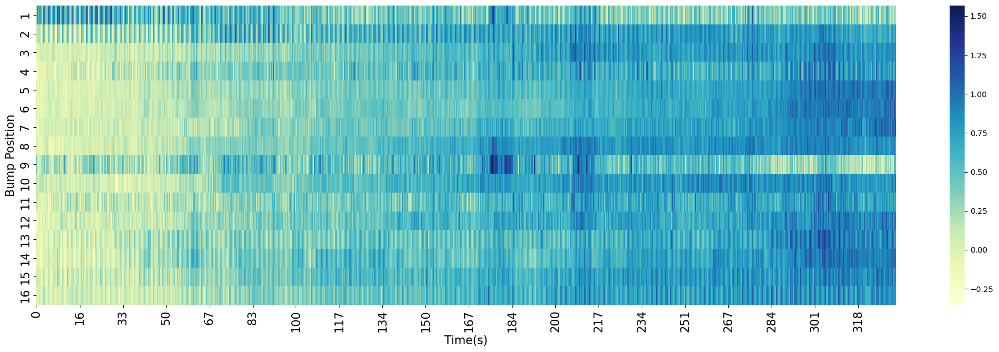

In [37]:
#Plot uncombined 16/8 ROi all together
plt.figure(figsize= (25,7))
time_array_imaging_round = np.round_(time_array_imaging, decimals =0)
p16 = sns.heatmap(dF_F_array_normalized.transpose(),cmap='YlGnBu', xticklabels = time_array_imaging_round)
sns.color_palette("light:b", as_cmap=True)
plt.xticks(ticks=plt.xticks()[0][0:], labels=np.array(plt.xticks()[0][0:]/volume_rate, dtype=np.int64), fontsize =15)
plt.yticks(ticks=plt.yticks()[0][0:], labels=np.array(plt.yticks()[0][0:]+1, dtype=np.int64), fontsize=15)
plt.locator_params(axis ='x',nbins = 20)
plt.xlabel('Time(s)', fontsize=15)
plt.ylabel('Bump Position', fontsize=15)
plt.show()

In [38]:
PVA_behavior_data_output_normalized = pd.DataFrame()
PVA_behavior_data_output_normalized['Time_Stamp'] = time_array_imaging
PVA_behavior_data_output_normalized['F_Roi_1'] = F_8_roi[:,0]
PVA_behavior_data_output_normalized['F_Roi_2'] = F_8_roi[:,1]
PVA_behavior_data_output_normalized['F_Roi_3'] = F_8_roi[:,2]
PVA_behavior_data_output_normalized['F_Roi_4'] = F_8_roi[:,3]
PVA_behavior_data_output_normalized['F_Roi_5'] = F_8_roi[:,4]
PVA_behavior_data_output_normalized['F_Roi_6'] = F_8_roi[:,5]
PVA_behavior_data_output_normalized['F_Roi_7'] = F_8_roi[:,6]
PVA_behavior_data_output_normalized['F_Roi_8'] = F_8_roi[:,7]
PVA_behavior_data_output_normalized['Raw_F_1'] = F_array_stimulation_period_removed[:,0]
PVA_behavior_data_output_normalized['Raw_F_2'] = F_array_stimulation_period_removed[:,1]
PVA_behavior_data_output_normalized['Raw_F_3'] = F_array_stimulation_period_removed[:,2]
PVA_behavior_data_output_normalized['Raw_F_4'] = F_array_stimulation_period_removed[:,3]
PVA_behavior_data_output_normalized['Raw_F_5'] = F_array_stimulation_period_removed[:,4]
PVA_behavior_data_output_normalized['Raw_F_6'] = F_array_stimulation_period_removed[:,5]
PVA_behavior_data_output_normalized['Raw_F_7'] = F_array_stimulation_period_removed[:,6]
PVA_behavior_data_output_normalized['Raw_F_8'] = F_array_stimulation_period_removed[:,7]
if ROI_total == 16:
    PVA_behavior_data_output_normalized['Raw_F_9'] = F_array_stimulation_period_removed[:,8]
    PVA_behavior_data_output_normalized['Raw_F_10'] = F_array_stimulation_period_removed[:,9]
    PVA_behavior_data_output_normalized['Raw_F_11'] = F_array_stimulation_period_removed[:,10]
    PVA_behavior_data_output_normalized['Raw_F_12'] = F_array_stimulation_period_removed[:,11]
    PVA_behavior_data_output_normalized['Raw_F_13'] = F_array_stimulation_period_removed[:,12]
    PVA_behavior_data_output_normalized['Raw_F_14'] = F_array_stimulation_period_removed[:,13]
    PVA_behavior_data_output_normalized['Raw_F_15'] = F_array_stimulation_period_removed[:,14]
    PVA_behavior_data_output_normalized['Raw_F_16'] = F_array_stimulation_period_removed[:,15]
PVA_behavior_data_output_normalized['dFF_Roi_1'] = dF_F_array_8_roi_normalized[:,0]
PVA_behavior_data_output_normalized['dFF_Roi_2'] = dF_F_array_8_roi_normalized[:,1]
PVA_behavior_data_output_normalized['dFF_Roi_3'] = dF_F_array_8_roi_normalized[:,2]
PVA_behavior_data_output_normalized['dFF_Roi_4'] = dF_F_array_8_roi_normalized[:,3]
PVA_behavior_data_output_normalized['dFF_Roi_5'] = dF_F_array_8_roi_normalized[:,4]
PVA_behavior_data_output_normalized['dFF_Roi_6'] = dF_F_array_8_roi_normalized[:,5]
PVA_behavior_data_output_normalized['dFF_Roi_7'] = dF_F_array_8_roi_normalized[:,6]
PVA_behavior_data_output_normalized['dFF_Roi_8'] = dF_F_array_8_roi_normalized[:,7]
PVA_behavior_data_output_normalized['Z_score_Roi_1'] = Z_score_array_8_roi[:,0]
PVA_behavior_data_output_normalized['Z_score_Roi_2'] = Z_score_array_8_roi[:,1]
PVA_behavior_data_output_normalized['Z_score_Roi_3'] = Z_score_array_8_roi[:,2]
PVA_behavior_data_output_normalized['Z_score_Roi_4'] = Z_score_array_8_roi[:,3]
PVA_behavior_data_output_normalized['Z_score_Roi_5'] = Z_score_array_8_roi[:,4]
PVA_behavior_data_output_normalized['Z_score_Roi_6'] = Z_score_array_8_roi[:,5]
PVA_behavior_data_output_normalized['Z_score_Roi_7'] = Z_score_array_8_roi[:,6]
PVA_behavior_data_output_normalized['Z_score_Roi_8'] = Z_score_array_8_roi[:,7]
PVA_behavior_data_output_normalized['PVA_Radian'] = PVA_radian_array_normalized
PVA_behavior_data_output_normalized['PVA_Angle'] = PVA_angle_Array_normalized
PVA_behavior_data_output_normalized['PVA_strength'] = PVA_strength_normalized
PVA_behavior_data_output_normalized['Bump_amplitude_max_min'] = bump_amplitude_dff_normalized
PVA_behavior_data_output_normalized['Bump_amplitude_PVA'] = bump_amplitude_dff_normalized_v3
PVA_behavior_data_output_normalized['Bump_width'] = bump_width

In [39]:
# Define file paths
output_file = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/TQfly597-002.npz"
tif_file_path = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/napari_roi/Test and screening/delta7_syt7f_SPARCS_Cach_exvivo/mecha and picro/TQfly597/ROI_16_TQfly597-002.tif"  # Change this to your actual TIFF file path

# Convert Pandas DataFrame to a dictionary of NumPy arrays
data_dict = {col: PVA_behavior_data_output_normalized[col].values for col in PVA_behavior_data_output_normalized.columns}

# Add the cut_indices array
data_dict["post_stim_frame"] = np.array(cut_indices)  # Ensure it's a NumPy array

# Read the TIFF file as a NumPy array
tif_image = tifffile.imread(tif_file_path)  # Load TIFF file

# Add the TIFF image to the dictionary
data_dict["ROI_16"] = tif_image  # Store the TIFF as an array in the .npz file

# Save everything in a .npz file
np.savez(output_file, **data_dict)

print(f"Data and TIFF image saved successfully as {output_file}")

Data and TIFF image saved successfully as /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/TQfly597-002.npz


# Pooled Group Analysis

Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/test and screening/delta7/exvivo write in test/no picro/TQfly593-001.npz


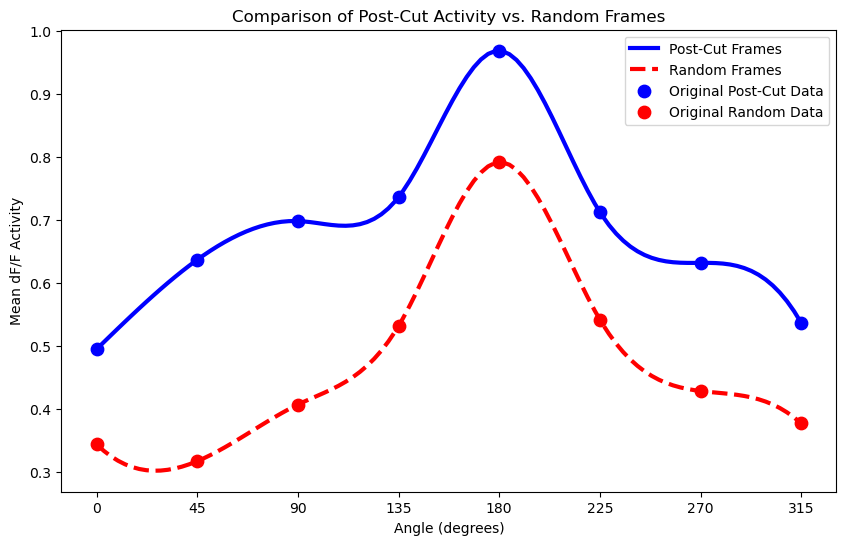

Mean FWHM of Post-Cut Distribution: 0.81 degrees
Mean FWHM of Random Distribution: 0.71 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/test and screening/delta7/exvivo write in test/no picro/TQfly593-002.npz


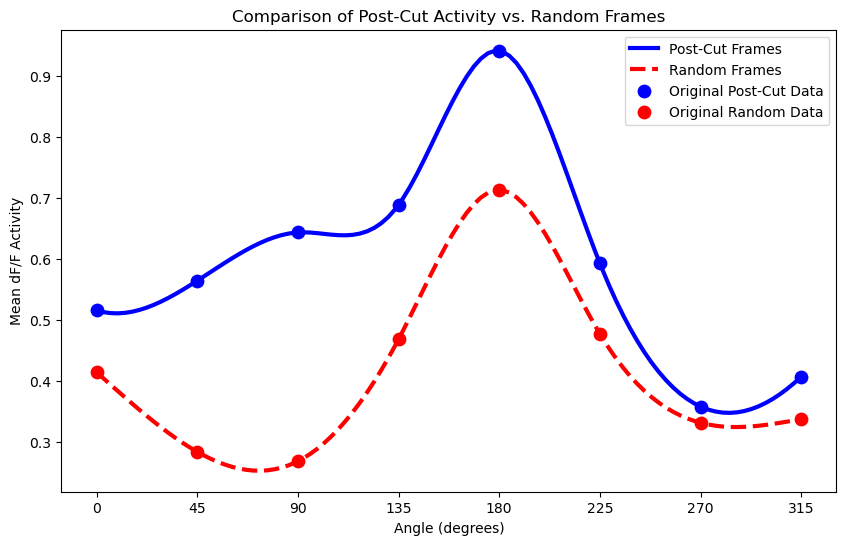

Mean FWHM of Post-Cut Distribution: 0.78 degrees
Mean FWHM of Random Distribution: 0.61 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/test and screening/delta7/exvivo write in test/picro/TQfly597-002.npz


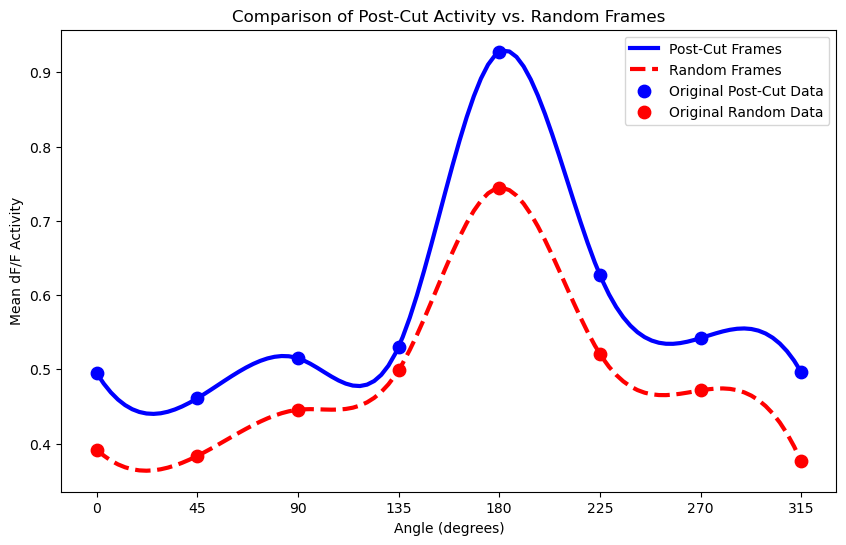

Mean FWHM of Post-Cut Distribution: 0.79 degrees
Mean FWHM of Random Distribution: 0.65 degrees
Processing file: /home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/test and screening/delta7/exvivo write in test/picro/TQfly597-001.npz


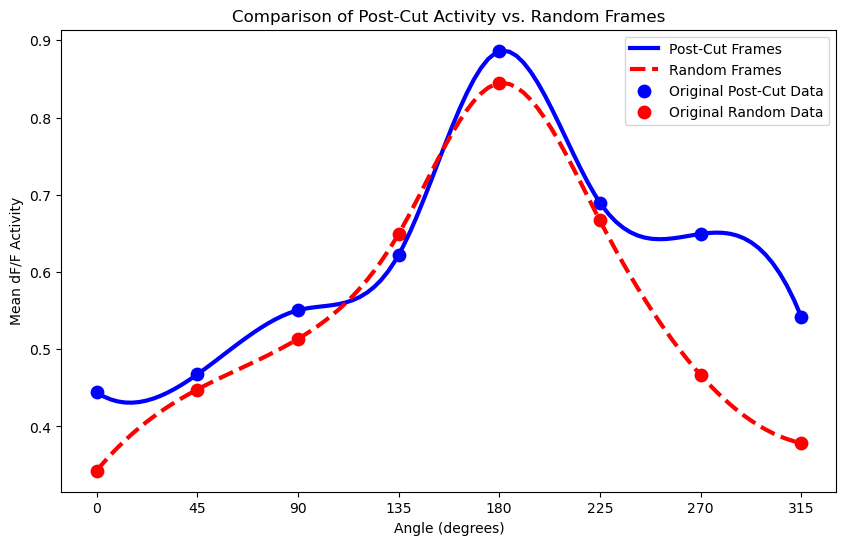

Mean FWHM of Post-Cut Distribution: 0.77 degrees
Mean FWHM of Random Distribution: 0.80 degrees


In [41]:
# Run analysis for each group
folder_group1 = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/test and screening/delta7/exvivo write in test/no picro"  # Replace with actual path
folder_group2 = "/home/tianhaoqiu/Documents/GitHub/2p_analysis/preprocessing_output/normalized/test and screening/delta7/exvivo write in test/picro"  # Replace with actual path


# Get results for each group
group1_post_mean_activity, group1_random_mean_activity, group1_mean_post, group1_mean_random  = process_group(folder_group1)
group2_post_mean_activity, group2_random_mean_activity, group2_mean_post, group2_mean_random  = process_group(folder_group2)

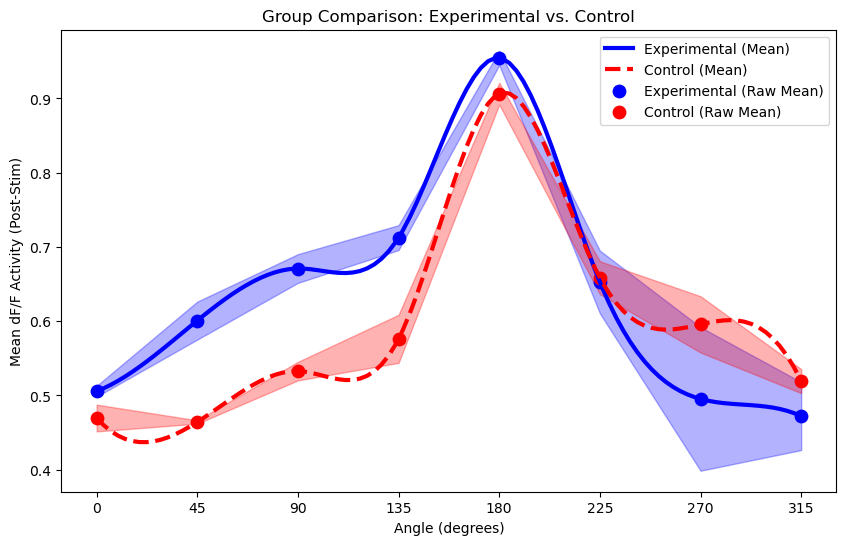

In [6]:
plot_group_comparison(
    roi_to_degrees=45,
    group1_data=group1_post_mean_activity,  # Only post-stim mean activity
    group2_data=group2_post_mean_activity,  # Only post-stim mean activity
    group1_label="Experimental",
    group2_label="Control"
)